## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import math
import itertools 
from scipy import stats
import time


#matplotlib libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors
import seaborn as sns

#date libraries
from dateutil import parser
from datetime import datetime, timedelta, date

#pandas options
pd.set_option('display.float_format', lambda x: '%.4f' % x)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Reading Data

In [2]:
df= pd.read_csv('data/tiger_abc_ds_whs_22_23_24.csv')

In [3]:
df.head(5)

,Unnamed: 0.1,Unnamed: 0,Outlet Code,Item Code,Item Brand,Description,Item Description,Segment,Promotion Description,Sum of HL,Year,Quarter,Month,Day,Company Code,Sum of Item in HL,Item Region Code,Item Search Description,Item Sub Brand,Sum of Quatity (Base),Sell To Customer Id
0,0,7,71000069,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,7.9200,2022,Qtr 1,January,17,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,100.0000,71000069
1,1,8,71000069,10003707,ABC,ABC Extra Stout Pint 24x33cl,ABC Extra Stout Pint 24x33cl,Drink Shop,Promo,0.5544,2022,Qtr 1,January,25,10290577,0.0792,10402069,ABC EXTRA STOUT PINT 24X33CL,ABC STOUT,7.0000,71000069
2,2,9,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,3.9600,2022,Qtr 1,January,3,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,50.0000,71000101
3,3,10,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,11.8800,2022,Qtr 1,January,11,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,150.0000,71000101
4,4,11,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,39.6000,2022,Qtr 1,January,15,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,500.0000,71000101


In [4]:
df.shape

(859287, 21)

## Data Cleaning

### Remove Duplicates

In [5]:
df.duplicated().sum()

0

### Handling Missing Value

In [6]:
df.isnull().sum()

Unnamed: 0.1               0
Unnamed: 0                 0
Outlet Code                0
Item Code                  0
Item Brand                 0
Description                0
Item Description           0
Segment                    0
Promotion Description      0
Sum of HL                  0
Year                       0
Quarter                    0
Month                      0
Day                        0
Company Code               0
Sum of Item in HL          5
Item Region Code           0
Item Search Description    0
Item Sub Brand             0
Sum of Quatity (Base)      0
Sell To Customer Id        0
dtype: int64

### Handling Inconsistent Data

#### Standardize capitalization

In [7]:
# Drop columns from the DataFrame
columns_to_drop = ['Unnamed: 0.1', 'Unnamed: 0']  # List of columns to drop

df.drop(columns=columns_to_drop, inplace=True)

In [8]:
df.columns

Index(['Outlet Code', 'Item Code', 'Item Brand', 'Description',
       'Item Description', 'Segment', 'Promotion Description', 'Sum of HL',
       'Year', 'Quarter', 'Month', 'Day', 'Company Code', 'Sum of Item in HL',
       'Item Region Code', 'Item Search Description', 'Item Sub Brand',
       'Sum of Quatity (Base)', 'Sell To Customer Id'],
      dtype='object')

In [9]:
df.columns = df.columns.str.replace(' ', '_').str.lower()

In [10]:
df.rename(columns={'sum_of_hl': 'volume'}, inplace=True)

In [11]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,volume,year,quarter,month,day,company_code,sum_of_item_in_hl,item_region_code,item_search_description,item_sub_brand,sum_of_quatity_(base),sell_to_customer_id
0,71000069,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,7.9200,2022,Qtr 1,January,17,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,100.0000,71000069
1,71000069,10003707,ABC,ABC Extra Stout Pint 24x33cl,ABC Extra Stout Pint 24x33cl,Drink Shop,Promo,0.5544,2022,Qtr 1,January,25,10290577,0.0792,10402069,ABC EXTRA STOUT PINT 24X33CL,ABC STOUT,7.0000,71000069
2,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,3.9600,2022,Qtr 1,January,3,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,50.0000,71000101
3,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,11.8800,2022,Qtr 1,January,11,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,150.0000,71000101
4,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,39.6000,2022,Qtr 1,January,15,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,500.0000,71000101


In [12]:
df.rename(columns={'sum_of_item_in_hl': 'item_in_hl'}, inplace=True)
df.rename(columns={'sum_of_quatity_(base)': 'quatity'}, inplace=True)
df.rename(columns={'volume': 'vol_hl'}, inplace=True)

In [13]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id
0,71000069,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,7.9200,2022,Qtr 1,January,17,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,100.0000,71000069
1,71000069,10003707,ABC,ABC Extra Stout Pint 24x33cl,ABC Extra Stout Pint 24x33cl,Drink Shop,Promo,0.5544,2022,Qtr 1,January,25,10290577,0.0792,10402069,ABC EXTRA STOUT PINT 24X33CL,ABC STOUT,7.0000,71000069
2,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,3.9600,2022,Qtr 1,January,3,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,50.0000,71000101
3,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,11.8800,2022,Qtr 1,January,11,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,150.0000,71000101
4,71000101,10003706,ABC,ABC Extra Stout Can 24x33cl,ABC Extra Stout Can 24x33cl,Drink Shop,Promo,39.6000,2022,Qtr 1,January,15,10290577,0.0792,10402069,ABC EXTRA STOUT CAN 24X33CL,ABC STOUT,500.0000,71000101


In [14]:
df["promotion_description"] = df["promotion_description"].str.lower()

In [15]:
df["item_search_description"]=df["item_search_description"].str.lower()

In [16]:
df["item_sub_brand"]=df["item_sub_brand"].str.lower()

In [17]:
df["segment"]=df["segment"].str.lower()

In [18]:
df["description"]=df["description"].str.lower()

In [19]:
df["month"]=df["month"].str.lower()

In [20]:
df["quarter"]=df["quarter"].str.lower()

In [21]:
# Convert "item_description" to lowercase
df["item_description"] = df["item_description"].str.lower()

In [22]:
# Convert "item_description" to lowercase
df["item_brand"] = df["item_brand"].str.lower()

In [23]:
# Replace "qtr 1" and "qtr 2" with "1" and "2", respectively
df['quarter'] = df['quarter'].replace({'qtr 1': 1, 'qtr 2': 2,'qtr 3':3,'qtr 4':4})

C:\Users\kunr01\AppData\Local\Temp\ipykernel_29552\3562289468.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['quarter'] = df['quarter'].replace({'qtr 1': 1, 'qtr 2': 2,'qtr 3':3,'qtr 4':4})


In [24]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,january,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100.0000,71000069
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,january,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7.0000,71000069
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,january,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50.0000,71000101
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,january,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150.0000,71000101
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,january,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500.0000,71000101


In [25]:
df['promotion_description'].value_counts()

promotion_description
promo                                                                               607385
oft_cn_vse_tiger crystal slk promotion pack discount                                 28544
star retailer rebate incentive                                                       24735
wedding/function                                                                     21479
on&off doi vse abc sg 20%                                                            21284
oft_cn_vse_tiger slk promotion pack discount                                         19790
nw_doi_vse tiger promo pack 11.11%                                                   17080
oft-doi-dtc-abc extra stout discount 3.85%                                           16324
oft-doi-vse-abc extra stout discount-srp-ds 10%                                      14696
beer house 2.0 block display nov& dec                                                 8326
beer house 2.0 rebate incentive                                     

In [26]:
df['item_description'].value_counts()

item_description
abc extra stout can 24x33cl                   329169
tiger can 24x33cl                             127774
tiger crys can case 24x33cl slk promo kh       49594
tiger crystal can case 24x33cl slk kh          46979
tiger can case 24x33cl yott kh                 42091
tiger can case 24x33cl slk promo kh            40597
tiger crystal pint 24x33cl                     33498
abc can case 24x33cl c000                      32677
tiger crystal can 24x33cl                      27099
tiger crys/reg cp can case20x33+4x33clkh       22824
tiger can case 24x33cl slk kh                  19884
tiger pint 24x33cl                             15710
parasol tiger blue                             12343
abc extra stout pint 24x33cl                   10158
tiger crystal can case 24x33cl yott kh          8677
abc extra stout can case 24x33cl slk kh         7549
tiger crys/soju cp can case 20x33+4x33cl        4616
abc extra stout can case 12x33cl                4155
abc reserve tall can case 24x

#### Standardize date formats

In [27]:
# Map month names to numbers
month_map = {
    "january": 1,
    "february": 2,
    "march": 3,
    "april":4,
    "may":5,
    "june":6,
    "july":7,
    "august":8,
    "september":9,
    "october":10,
    "november":11,
    "december":12,
}
df["month"] = df["month"].map(month_map)

# Combine columns into a date format
df["date"] = pd.to_datetime(df[["year", "month", "day"]])

In [28]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id,date
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100.0000,71000069,2022-01-17
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7.0000,71000069,2022-01-25
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50.0000,71000101,2022-01-03
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150.0000,71000101,2022-01-11
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500.0000,71000101,2022-01-15


In [29]:
df.dtypes

outlet_code                         int64
item_code                           int64
item_brand                         object
description                        object
item_description                   object
segment                            object
promotion_description              object
vol_hl                            float64
year                                int64
quarter                             int64
month                               int64
day                                 int64
company_code                        int64
item_in_hl                        float64
item_region_code                    int64
item_search_description            object
item_sub_brand                     object
quatity                           float64
sell_to_customer_id                 int64
date                       datetime64[ns]
dtype: object

In [30]:
df['date'] = pd.to_datetime(df['date'], format= "%Y/%m/%d")

In [31]:
df['quatity'] = df['quatity'].astype('int64')

In [32]:
df.dtypes

outlet_code                         int64
item_code                           int64
item_brand                         object
description                        object
item_description                   object
segment                            object
promotion_description              object
vol_hl                            float64
year                                int64
quarter                             int64
month                               int64
day                                 int64
company_code                        int64
item_in_hl                        float64
item_region_code                    int64
item_search_description            object
item_sub_brand                     object
quatity                             int64
sell_to_customer_id                 int64
date                       datetime64[ns]
dtype: object

In [33]:
min(df['date']), max(df['date'])

(Timestamp('2022-01-01 00:00:00'), Timestamp('2024-09-29 00:00:00'))

### Apply New Features

In [34]:
import calendar
# Function to get the day of the week as a string
def get_day_of_week(date):
    day_number = date.weekday()
    return calendar.day_name[day_number]

df['day_of_week'] = df['date'].apply(get_day_of_week)

In [35]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id,date,day_of_week
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100,71000069,2022-01-17,Monday
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7,71000069,2022-01-25,Tuesday
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50,71000101,2022-01-03,Monday
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150,71000101,2022-01-11,Tuesday
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500,71000101,2022-01-15,Saturday


In [36]:
# Function to check if a date is a weekend or weekday
def weekend_or_weekday(date):
    day_number = date.weekday()
    if day_number >= 5:
        return 1
    else:
        return 0
df['is_weekend'] = df['date'].apply(weekend_or_weekday)

In [37]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id,date,day_of_week,is_weekend
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100,71000069,2022-01-17,Monday,0
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7,71000069,2022-01-25,Tuesday,0
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50,71000101,2022-01-03,Monday,0
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150,71000101,2022-01-11,Tuesday,0
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500,71000101,2022-01-15,Saturday,1


In [38]:
import datetime
import pandas as pd

# Define the is_holiday function
def is_holidays(date):
    holidays = [
        datetime.date(2024, 1, 1), datetime.date(2024, 1, 7), datetime.date(2024, 3, 8), 
        datetime.date(2024, 4, 13), datetime.date(2024, 4, 14), datetime.date(2024, 4, 15), 
        datetime.date(2024, 4, 16), datetime.date(2024, 5, 1), datetime.date(2024, 5, 14), 
        datetime.date(2024, 5, 22), datetime.date(2024, 5, 26), datetime.date(2024, 6, 18), 
        datetime.date(2024, 9, 24), datetime.date(2024, 10, 1), datetime.date(2024, 10, 2), 
        datetime.date(2024, 10, 3), datetime.date(2024, 10, 15), datetime.date(2024, 10, 29), 
        datetime.date(2024, 11, 9), datetime.date(2024, 11, 14), datetime.date(2024, 11, 15), 
        datetime.date(2024, 11, 16),datetime.date(2024,12,25),datetime.date(2024,2,14),
        datetime.date(2023, 1, 1), datetime.date(2023, 1, 7), datetime.date(2023, 3, 8), 
        datetime.date(2023, 4, 14), datetime.date(2023, 4, 15), datetime.date(2023, 4, 16), 
        datetime.date(2023, 5, 1), datetime.date(2023, 5, 4), datetime.date(2023, 5, 8), 
        datetime.date(2023, 5, 14), datetime.date(2023, 6, 18), datetime.date(2023, 9, 24), 
        datetime.date(2023, 10, 13), datetime.date(2023, 10, 14), datetime.date(2023, 10, 15), 
        datetime.date(2023, 10, 29), datetime.date(2023, 11, 9), datetime.date(2023, 11, 26), 
        datetime.date(2023, 11, 27), datetime.date(2023, 11, 28),datetime.date(2023,12,25),
        datetime.date(2023,2,14),
        datetime.date(2022, 1, 1), datetime.date(2022, 1, 7), datetime.date(2022, 3, 8), 
        datetime.date(2022, 4, 14), datetime.date(2022, 4, 15), datetime.date(2022, 4, 16), 
        datetime.date(2022, 5, 1), datetime.date(2022, 5, 14), datetime.date(2022, 5, 15), 
        datetime.date(2022, 5, 19), datetime.date(2022, 6, 18), datetime.date(2022, 9, 24), 
        datetime.date(2022, 9, 25), datetime.date(2022, 9, 26), datetime.date(2022, 10, 15), 
        datetime.date(2022, 10, 29), datetime.date(2022, 11, 7), datetime.date(2022, 11, 8), 
        datetime.date(2022, 11, 9),datetime.date(2022,12,25),datetime.date(2022,2,14),
    ]
    
    # If date is a string or integer, attempt to convert it to datetime
    if isinstance(date, str) or isinstance(date, int):
        try:
            date = pd.to_datetime(date).date()
        except ValueError:
            return False  # Invalid date

    # If the input is already a datetime object, convert to date
    if isinstance(date, datetime.datetime):
        date = date.date()

    return date in holidays

# Assuming df['date'] is a column containing datetime or date values
# Ensure the date column is of datetime type
df['date'] = pd.to_datetime(df['date'])

# Apply the function
df['is_holiday'] = df['date'].apply(is_holidays)

In [39]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id,date,day_of_week,is_weekend,is_holiday
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100,71000069,2022-01-17,Monday,0,False
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7,71000069,2022-01-25,Tuesday,0,False
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50,71000101,2022-01-03,Monday,0,False
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150,71000101,2022-01-11,Tuesday,0,False
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500,71000101,2022-01-15,Saturday,1,False


In [40]:
# Function to calculate the week of the month
def week_of_month(date):
    year, month, day = date.isocalendar()
    first_week_day = (day - date.day % 7 + 1) if date.day else 1
    return (date.day + first_week_day - 2) // 7 + 1

# Adding a new column 'week_of_month' to the DataFrame
df['week_of_month'] = df['date'].apply(week_of_month)

In [41]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id,date,day_of_week,is_weekend,is_holiday,week_of_month
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100,71000069,2022-01-17,Monday,0,False,3
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7,71000069,2022-01-25,Tuesday,0,False,4
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50,71000101,2022-01-03,Monday,0,False,1
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150,71000101,2022-01-11,Tuesday,0,False,2
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500,71000101,2022-01-15,Saturday,1,False,3


In [42]:
# Assuming df['is_holiday'] is the column containing boolean values True or False
df['is_holiday'] = df['is_holiday'].astype(int)

In [43]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id,date,day_of_week,is_weekend,is_holiday,week_of_month
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100,71000069,2022-01-17,Monday,0,0,3
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7,71000069,2022-01-25,Tuesday,0,0,4
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50,71000101,2022-01-03,Monday,0,0,1
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150,71000101,2022-01-11,Tuesday,0,0,2
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500,71000101,2022-01-15,Saturday,1,0,3


In [44]:
# Function to check if the month is in the specified seasons
def is_season(month):
    return month in [3, 4, 9, 11, 12]

# Adding a new column 'is_season' to the DataFrame based on the month
df['is_season'] = df['date'].dt.month.apply(is_season).astype(int)

In [45]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_region_code,item_search_description,item_sub_brand,quatity,sell_to_customer_id,date,day_of_week,is_weekend,is_holiday,week_of_month,is_season
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,100,71000069,2022-01-17,Monday,0,0,3,0
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,10402069,abc extra stout pint 24x33cl,abc stout,7,71000069,2022-01-25,Tuesday,0,0,4,0
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,50,71000101,2022-01-03,Monday,0,0,1,0
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,150,71000101,2022-01-11,Tuesday,0,0,2,0
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,10402069,abc extra stout can 24x33cl,abc stout,500,71000101,2022-01-15,Saturday,1,0,3,0


### Remove Irrelevant Data

In [46]:
df[df['item_in_hl'] == 0.0]['item_in_hl'].value_counts()

item_in_hl
0.0000    21789
Name: count, dtype: int64

In [47]:
df.drop(df[np.isclose(df['item_in_hl'], 0, atol=1e-4)].index, inplace=True)

In [48]:
df[df['item_in_hl'] == 0.0]['item_in_hl'].value_counts()

Series([], Name: count, dtype: int64)

In [49]:
df['item_in_hl'].value_counts()

item_in_hl
0.0792     772681
0.1584      45371
0.0396       7991
0.2376       5539
0.3168       2772
0.4752        799
0.3960        611
0.6336        332
0.7920        283
0.5544        153
0.9504        139
0.7128        106
1.1088         74
0.8712         69
1.1880         51
1.5840         40
1.2672         39
1.4256         38
1.0296         36
0.1188         28
1.5048         24
1.3464         22
2.3760         20
1.9008         20
1.7424         19
2.0592         16
1.6632         15
2.2968         13
2.5344         13
2.1384         12
1.8216         12
2.2176         11
0.7920         11
3.3264          8
2.8512          7
1.9800          7
2.6928          7
2.6136          6
3.2472          5
3.1680          5
2.7720          5
3.0096          5
4.2768          5
3.0888          5
4.4352          4
4.7520          4
4.5936          4
4.5144          4
3.5640          4
3.6432          4
2.4552          3
3.7224          3
3.4848          2
3.8016          2
2.9304          2

In [50]:
df.shape

(837498, 25)

In [51]:
# Assuming df is your DataFrame
df['item_in_hl'] = df['item_in_hl'].abs()

In [52]:
df['item_in_hl'].value_counts()

item_in_hl
0.0792     772681
0.1584      45371
0.0396       7991
0.2376       5539
0.3168       2772
0.4752        799
0.3960        611
0.6336        332
0.7920        283
0.5544        153
0.9504        139
0.7128        106
1.1088         74
0.8712         69
1.1880         51
1.5840         40
1.2672         39
1.4256         38
1.0296         36
0.1188         28
1.5048         24
1.3464         22
2.3760         20
1.9008         20
1.7424         19
2.0592         16
1.6632         15
2.2968         13
2.5344         13
2.1384         12
1.8216         12
2.2176         11
0.7920         11
3.3264          8
2.8512          7
1.9800          7
2.6928          7
2.6136          6
3.2472          5
3.1680          5
2.7720          5
3.0096          5
4.2768          5
3.0888          5
4.4352          4
4.7520          4
4.5936          4
4.5144          4
3.5640          4
3.6432          4
2.4552          3
3.7224          3
3.4848          2
3.8016          2
2.9304          2

In [53]:
df.shape

(837498, 25)

In [54]:
min(df['item_in_hl']), max(df['item_in_hl'])

(0.0396, 10.1376)

In [55]:
""" # Assuming df is your DataFrame
filtered_df = df[(df['volume'] >= 100.0000) & (df['volume'] <= 900.0000)]
value_counts = filtered_df[['volume', 'outlet_code', 'item_brand', 'date','segment']].value_counts()
print(value_counts) """

" # Assuming df is your DataFrame\nfiltered_df = df[(df['volume'] >= 100.0000) & (df['volume'] <= 900.0000)]\nvalue_counts = filtered_df[['volume', 'outlet_code', 'item_brand', 'date','segment']].value_counts()\nprint(value_counts) "

In [56]:
df.columns

Index(['outlet_code', 'item_code', 'item_brand', 'description',
       'item_description', 'segment', 'promotion_description', 'vol_hl',
       'year', 'quarter', 'month', 'day', 'company_code', 'item_in_hl',
       'item_region_code', 'item_search_description', 'item_sub_brand',
       'quatity', 'sell_to_customer_id', 'date', 'day_of_week', 'is_weekend',
       'is_holiday', 'week_of_month', 'is_season'],
      dtype='object')

In [57]:
df['quatity'].value_counts()

quatity
1        218547
5        135216
10       121126
2         75356
20        55946
3         46807
50        27836
100       18914
30        18217
40        14966
15        12993
60         8055
4          7869
6          6989
200        5123
12         4491
9          4136
120        3977
25         3598
17         3091
7          2913
34         2905
55         2400
80         2188
8          2152
110        1899
300        1859
51         1558
150        1294
11         1168
101        1068
500         994
18          968
45          963
26          906
70          871
13          824
90          713
35          623
240         616
27          541
165         529
180         478
16          443
14          414
85          384
68          382
400         373
21          333
250         316
360         315
220         280
135         280
160         277
22          277
1000        256
121         244
140         239
270         229
600         227
19          219
54          216


In [58]:
df['day'].value_counts()

day
25    35046
6     34735
28    31858
7     31420
17    31290
11    31148
27    30376
29    29746
24    29717
5     29568
26    28432
30    28075
21    27773
22    27715
23    27020
20    26877
13    26753
10    26570
9     26128
12    26015
18    25923
16    25896
4     25468
14    24734
19    24496
15    24476
8     22610
3     22247
2     19888
1     19588
31    15910
Name: count, dtype: int64

In [59]:
df.dtypes

outlet_code                         int64
item_code                           int64
item_brand                         object
description                        object
item_description                   object
segment                            object
promotion_description              object
vol_hl                            float64
year                                int64
quarter                             int64
month                               int64
day                                 int64
company_code                        int64
item_in_hl                        float64
item_region_code                    int64
item_search_description            object
item_sub_brand                     object
quatity                             int64
sell_to_customer_id                 int64
date                       datetime64[ns]
day_of_week                        object
is_weekend                          int64
is_holiday                          int32
week_of_month                     

In [60]:
df.drop('item_region_code', axis=1, inplace=True)

In [61]:
df.drop('sell_to_customer_id', axis=1, inplace=True)

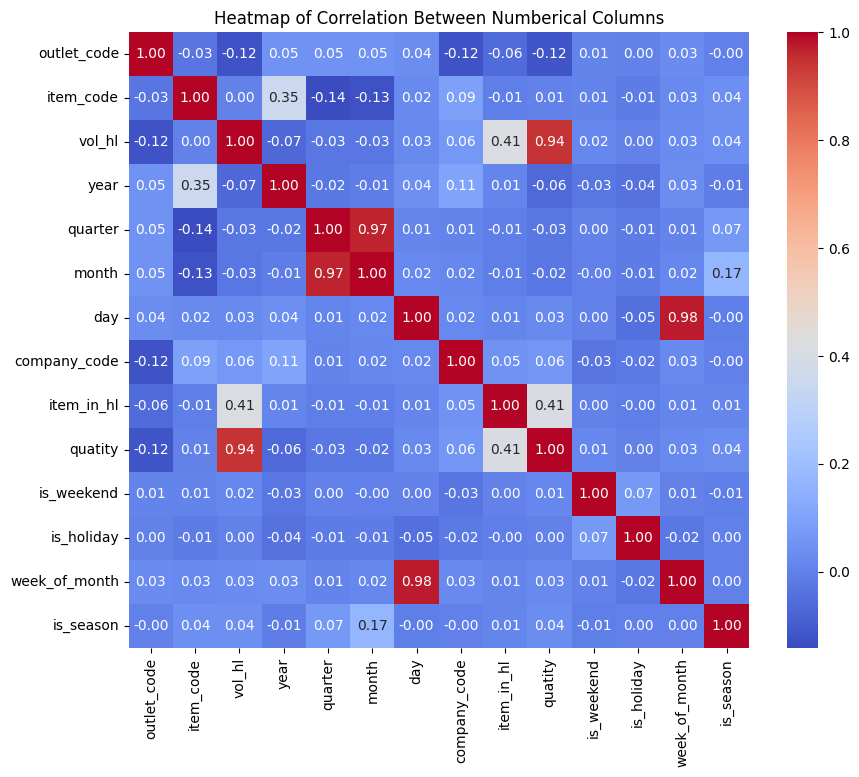

In [62]:
# Select only numerical columns for correlation matrix
numerical_columns = df.select_dtypes(include=['int', 'float']).columns
correlation_matrix = df[numerical_columns].corr()

# Plot the heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Correlation Between Numberical Columns')
plt.show()

In [63]:
df.head(5)

,outlet_code,item_code,item_brand,description,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_search_description,item_sub_brand,quatity,date,day_of_week,is_weekend,is_holiday,week_of_month,is_season
0,71000069,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,abc extra stout can 24x33cl,abc stout,100,2022-01-17,Monday,0,0,3,0
1,71000069,10003707,abc,abc extra stout pint 24x33cl,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,abc extra stout pint 24x33cl,abc stout,7,2022-01-25,Tuesday,0,0,4,0
2,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,abc extra stout can 24x33cl,abc stout,50,2022-01-03,Monday,0,0,1,0
3,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,abc extra stout can 24x33cl,abc stout,150,2022-01-11,Tuesday,0,0,2,0
4,71000101,10003706,abc,abc extra stout can 24x33cl,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,abc extra stout can 24x33cl,abc stout,500,2022-01-15,Saturday,1,0,3,0


In [64]:
df['description'].value_counts()

description
abc extra stout can 24x33cl                 303799
tiger can 24x33cl                           123743
credit/debit note                            82898
tiger can case 24x33cl yott kh               42091
tiger crystal can case 24x33cl slk kh        40305
tiger crys can case 24x33cl slk promo kh     37809
tiger crystal pint 24x33cl                   32401
tiger can case 24x33cl slk promo kh          31622
tiger crystal can 24x33cl                    27089
abc can case 24x33cl c000                    24464
tiger crys/reg cp can case20x33+4x33clkh     22824
tiger pint 24x33cl                           15379
tiger can case 24x33cl slk kh                12631
abc extra stout pint 24x33cl                  9792
tiger crystal can case 24x33cl yott kh        8677
abc extra stout can case 12x33cl              4155
tiger crys/soju cp can case 20x33+4x33cl      4027
abc reserve tall can case 24x33cl slk kh      3572
tiger can case 12x33cl                        3360
tiger crystal can c

In [65]:
df.drop('description', axis=1, inplace=True)

In [66]:
df.drop('item_search_description', axis=1, inplace=True)

In [67]:
df['item_sub_brand'].value_counts()

item_sub_brand
abc stout        384735
tiger            283629
tiger crystal    159372
tiger soju         5190
abc reserve        4567
abc                   5
Name: count, dtype: int64

In [68]:
df["day_of_weeks"] = df["day_of_week"].str.lower()

In [69]:
df.drop('day_of_week', axis=1, inplace=True)

In [70]:
df.head(5)

,outlet_code,item_code,item_brand,item_description,segment,promotion_description,vol_hl,year,quarter,month,day,company_code,item_in_hl,item_sub_brand,quatity,date,is_weekend,is_holiday,week_of_month,is_season,day_of_weeks
0,71000069,10003706,abc,abc extra stout can 24x33cl,drink shop,promo,7.9200,2022,1,1,17,10290577,0.0792,abc stout,100,2022-01-17,0,0,3,0,monday
1,71000069,10003707,abc,abc extra stout pint 24x33cl,drink shop,promo,0.5544,2022,1,1,25,10290577,0.0792,abc stout,7,2022-01-25,0,0,4,0,tuesday
2,71000101,10003706,abc,abc extra stout can 24x33cl,drink shop,promo,3.9600,2022,1,1,3,10290577,0.0792,abc stout,50,2022-01-03,0,0,1,0,monday
3,71000101,10003706,abc,abc extra stout can 24x33cl,drink shop,promo,11.8800,2022,1,1,11,10290577,0.0792,abc stout,150,2022-01-11,0,0,2,0,tuesday
4,71000101,10003706,abc,abc extra stout can 24x33cl,drink shop,promo,39.6000,2022,1,1,15,10290577,0.0792,abc stout,500,2022-01-15,1,0,3,0,saturday


In [71]:
df.dtypes

outlet_code                       int64
item_code                         int64
item_brand                       object
item_description                 object
segment                          object
promotion_description            object
vol_hl                          float64
year                              int64
quarter                           int64
month                             int64
day                               int64
company_code                      int64
item_in_hl                      float64
item_sub_brand                   object
quatity                           int64
date                     datetime64[ns]
is_weekend                        int64
is_holiday                        int32
week_of_month                     int64
is_season                         int32
day_of_weeks                     object
dtype: object

 ### Outlier Detection and Treatment

#### Descriptive Statistics

In [72]:
# separate numerical and categorical features
num_feat = df.select_dtypes( include = ['int64','float64'])
cat_feat = df.select_dtypes( exclude = ['int64','float64','datetime64[ns]'])

##### Numerical Features

In [73]:
#### Central Tendency 
# 1st moment (mean)
ct_mean = pd.DataFrame(num_feat.apply( np.mean )).T
# median
ct_median = pd.DataFrame(num_feat.apply( np.median )).T

#### Dispersion
# 2nd moment (variance)
d_var = pd.DataFrame(num_feat.apply( np.var)).T
# Standard Deviation
d_std = pd.DataFrame(num_feat.apply( np.std)).T
# min
d_min = pd.DataFrame(num_feat.apply(min)).T
# max
d_max = pd.DataFrame(num_feat.apply(max)).T
# range
d_range = pd.DataFrame(num_feat.apply(lambda x: x.max() - x.min())).T
# 3rd moment (Skew)
d_sk = pd.DataFrame(num_feat.apply(lambda x: x.skew())).T
# 4th moment (Kurtosis)
d_kurt = pd.DataFrame(num_feat.apply(lambda x: x.kurtosis())).T
# Q1 quantile
d_q1 = pd.DataFrame(num_feat.apply(lambda x: np.quantile(x, .25))).T
# Q3 quantile
d_q3 = pd.DataFrame(num_feat.apply(lambda x: np.quantile(x, .75))).T

In [74]:
# concatenate
m = pd.concat([d_min, d_max, d_range, ct_mean, d_q1, ct_median, d_q3, d_std, d_sk, d_kurt]).T.reset_index()
m.columns = ['attributes', 'min', 'max','range','mean','25%', '50%','75%','std', 'skew', 'kurtosis']
m

,attributes,min,max,range,mean,25%,50%,75%,std,skew,kurtosis
0,outlet_code,71000069.0000,79050238.0000,8050169.0000,75249835.4543,73007180.0000,76005807.0000,78005541.0000,2626630.4442,-0.2505,-1.2192
1,item_code,10000424.0000,10126314.0000,125890.0000,10037949.7663,10003706.0000,10003706.0000,10105623.0000,52549.9965,0.8861,-1.1916
2,vol_hl,-118.8000,724.6800,843.4800,1.5708,0.0792,0.3960,0.7920,6.0992,23.4416,1091.6361
3,year,2022.0000,2024.0000,2.0000,2022.8977,2022.0000,2023.0000,2024.0000,0.8001,0.1859,-1.4155
4,quarter,1.0000,4.0000,3.0000,2.3474,1.0000,2.0000,3.0000,1.0483,0.1288,-1.1953
5,month,1.0000,12.0000,11.0000,6.0677,3.0000,6.0000,9.0000,3.2121,0.1724,-1.0192
6,day,1.0000,31.0000,30.0000,16.3237,9.0000,17.0000,24.0000,8.7582,-0.0420,-1.2311
7,company_code,10021186.0000,10402069.0000,380883.0000,10071534.6267,10021194.0000,10021201.0000,10021214.0000,103971.2586,1.7898,1.6522
8,item_in_hl,0.0396,10.1376,10.0980,0.0878,NaN,NaN,NaN,0.0716,38.2589,2513.4452
9,quatity,1.0000,12000.0000,11999.0000,20.6944,1.0000,5.0000,15.0000,82.1706,29.8409,2118.4428


##### Categorical Features

In [75]:
# check unique values of each feature
cat_feat.apply(lambda x: x.nunique())

item_brand                 2
item_description          31
segment                    2
promotion_description    134
item_sub_brand             6
is_holiday                 2
is_season                  2
day_of_weeks               7
dtype: int64

#### Using IQR to detect outliers

In [76]:
df.shape

(837498, 21)

In [77]:
df.columns

Index(['outlet_code', 'item_code', 'item_brand', 'item_description', 'segment',
       'promotion_description', 'vol_hl', 'year', 'quarter', 'month', 'day',
       'company_code', 'item_in_hl', 'item_sub_brand', 'quatity', 'date',
       'is_weekend', 'is_holiday', 'week_of_month', 'is_season',
       'day_of_weeks'],
      dtype='object')

In [78]:
# Define a function to detect outliers based on IQR
def detect_outliers_iqr(df, columns):
    outlier_indices = []
    
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Get the indices of outliers for each column
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)].index
        outlier_indices.extend(outliers)
    
    # Get the unique indices of outliers
    outlier_indices = list(set(outlier_indices))
    
    return df.loc[outlier_indices]

# Specify the columns to check for outliers
columns_to_check = ['vol_hl', 'quatity', 'item_in_hl']

# Detect outliers
outliers_df = detect_outliers_iqr(df, columns_to_check)

# Select the desired columns to display
output_columns = ['date', 'segment', 'quatity', 'vol_hl', 'item_in_hl','outlet_code','item_brand']
outliers_to_display = outliers_df[output_columns]

# Print the outliers
print(outliers_to_display)


             date     segment  quatity    vol_hl  item_in_hl  outlet_code  \
0      2022-01-17  drink shop      100    7.9200      0.0792     71000069   
2      2022-01-03  drink shop       50    3.9600      0.0792     71000101   
3      2022-01-11  drink shop      150   11.8800      0.0792     71000101   
4      2022-01-15  drink shop      500   39.6000      0.0792     71000101   
5      2022-01-19  drink shop      100    7.9200      0.0792     71000101   
6      2022-01-03  drink shop       47    3.7224      0.0792     71000101   
8      2022-01-25  drink shop      140   11.0880      0.0792     71000103   
9      2022-01-29  drink shop      100    7.9200      0.0792     71000103   
10     2022-01-04  wholesaler      200   15.8400      0.0792     71000106   
11     2022-01-10  wholesaler      200   15.8400      0.0792     71000106   
12     2022-01-19  wholesaler      200   15.8400      0.0792     71000106   
13     2022-01-25  wholesaler      500   39.6000      0.0792     71000106   

In [79]:
# Get the value counts of the 'quantity' column for each unique value in the 'segment' column
df['quatity'].groupby(df['segment']).value_counts()

segment     quatity
drink shop  1          191963
            5          119907
            10          96189
            2           70350
            20          38529
            3           30146
            50          12052
            30          10000
            15           9519
            40           7924
            4            6699
            6            6252
            12           4058
            100          4007
            9            3248
            60           2854
            7            2399
            25           2300
            8            1747
            120          1244
            17           1232
            34           1031
            11           1008
            200           866
            55            808
            80            775
            110           674
            26            653
            51            614
            13            567
            18            452
            45            404
            150     

In [80]:
df.shape

(837498, 21)

In [81]:
# Delete rows where the quantity is lower than 10 for the 'Wholesaler'
df = df[~((df['segment'] == 'wholesaler') & (df['quatity'] <= 10))]

In [82]:
df.shape

(745287, 21)

In [83]:
# Delete rows where the quantity is lower than 10 for the 'Wholesaler'
df = df[~((df['segment'] == 'drink shop') & (df['quatity'] >= 2000))]

In [84]:
df.shape

(745256, 21)

In [87]:
df.columns

Index(['outlet_code', 'item_code', 'item_brand', 'item_description', 'segment',
       'promotion_description', 'vol_hl', 'year', 'quarter', 'month', 'day',
       'company_code', 'item_in_hl', 'item_sub_brand', 'quatity', 'date',
       'is_weekend', 'is_holiday', 'week_of_month', 'is_season',
       'day_of_weeks'],
      dtype='object')

In [88]:
df.drop('outlet_code', axis=1, inplace=True)
df.drop('item_code', axis=1, inplace=True)
df.drop('company_code', axis=1, inplace=True)
df.drop('item_description', axis=1, inplace=True)
df.drop('promotion_description', axis=1, inplace=True)

In [89]:
df.head(5)

,item_brand,segment,vol_hl,year,quarter,month,day,item_in_hl,item_sub_brand,quatity,date,is_weekend,is_holiday,week_of_month,is_season,day_of_weeks
0,abc,drink shop,7.9200,2022,1,1,17,0.0792,abc stout,100,2022-01-17,0,0,3,0,monday
1,abc,drink shop,0.5544,2022,1,1,25,0.0792,abc stout,7,2022-01-25,0,0,4,0,tuesday
2,abc,drink shop,3.9600,2022,1,1,3,0.0792,abc stout,50,2022-01-03,0,0,1,0,monday
3,abc,drink shop,11.8800,2022,1,1,11,0.0792,abc stout,150,2022-01-11,0,0,2,0,tuesday
4,abc,drink shop,39.6000,2022,1,1,15,0.0792,abc stout,500,2022-01-15,1,0,3,0,saturday


In [90]:
df.drop('vol_hl', axis=1, inplace=True)
df.drop('quarter', axis=1, inplace=True)
df.drop('item_in_hl', axis=1, inplace=True)

In [91]:
df.head(5)

,item_brand,segment,year,month,day,item_sub_brand,quatity,date,is_weekend,is_holiday,week_of_month,is_season,day_of_weeks
0,abc,drink shop,2022,1,17,abc stout,100,2022-01-17,0,0,3,0,monday
1,abc,drink shop,2022,1,25,abc stout,7,2022-01-25,0,0,4,0,tuesday
2,abc,drink shop,2022,1,3,abc stout,50,2022-01-03,0,0,1,0,monday
3,abc,drink shop,2022,1,11,abc stout,150,2022-01-11,0,0,2,0,tuesday
4,abc,drink shop,2022,1,15,abc stout,500,2022-01-15,1,0,3,0,saturday


In [92]:
df.drop('date', axis=1, inplace=True)
df.drop('day_of_weeks', axis=1, inplace=True)

In [93]:
df.head(5)

,item_brand,segment,year,month,day,item_sub_brand,quatity,is_weekend,is_holiday,week_of_month,is_season
0,abc,drink shop,2022,1,17,abc stout,100,0,0,3,0
1,abc,drink shop,2022,1,25,abc stout,7,0,0,4,0
2,abc,drink shop,2022,1,3,abc stout,50,0,0,1,0
3,abc,drink shop,2022,1,11,abc stout,150,0,0,2,0
4,abc,drink shop,2022,1,15,abc stout,500,1,0,3,0


In [94]:
df.drop('is_weekend', axis=1, inplace=True)
df.drop('is_holiday', axis=1, inplace=True)
df.drop('is_season', axis=1, inplace=True)

In [95]:
df.head(5)

,item_brand,segment,year,month,day,item_sub_brand,quatity,week_of_month
0,abc,drink shop,2022,1,17,abc stout,100,3
1,abc,drink shop,2022,1,25,abc stout,7,4
2,abc,drink shop,2022,1,3,abc stout,50,1
3,abc,drink shop,2022,1,11,abc stout,150,2
4,abc,drink shop,2022,1,15,abc stout,500,3


In [85]:
""" df.to_csv('data_cleaned.csv') """

" df.to_csv('data_cleaned.csv') "